<a href="https://colab.research.google.com/github/Neil-Kloper/ODSC-Competition/blob/master/ODSC_SKLearn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ODSC Competition entry

This notebook is a baseline version for my entry into the ODSC data science competition. The goal of this notebook is to produce a reasonable scoring model using sci-kit learn as a performance baseline. My end goal is to produce a better performing model inside FastAI should time allow.


In [20]:
import pandas as pd
odsc_train = pd.read_csv('/content/drive/My Drive/ODSC comp/train_set.csv')
odsc_train.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


In [21]:
solutions = pd.read_csv('/content/drive/My Drive/ODSC comp/test_solutions (1).csv')
solutions.head()

,pm,stator_tooth,stator_yoke,stator_winding
0,-2.450515,-2.046755,-1.800853,-1.993896
1,-2.450277,-2.047172,-1.801808,-1.994415
2,-2.450026,-2.047384,-1.802578,-1.995002
3,-2.449813,-2.047343,-1.801862,-1.995174
4,-2.450108,-2.047665,-1.801228,-1.995189


In [22]:
odsc_test = pd.read_csv('/content/drive/My Drive/ODSC comp/test_set (1).csv')
odsc_test.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q
0,-2.749564,-1.073478,0.336463,-1.295874,-1.222426,-0.248547,1.041590,-0.250223
1,-2.749612,-1.072823,0.339015,-1.298281,-1.222425,-0.247740,1.038055,-0.248936
2,-2.746339,-1.073277,0.340775,-1.299160,-1.222428,-0.247232,1.035532,-0.248042
3,-2.747337,-1.074854,0.341972,-1.300307,-1.222428,-0.246810,1.033727,-0.247364
4,-2.748052,-1.076696,0.344047,-1.301804,-1.222429,-0.246473,1.032427,-0.246897


### Scaling by Z-score
As we can see below, the data has been scaled to its z-score. the mean and standard deviation of this data is now close to 0 and 1 respectively.


In [ ]:
odsc_train.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
count,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000,846368.000000
mean,0.082853,0.027152,0.052589,0.003834,-0.010858,-0.041547,0.026560,-0.040897,-0.000441,0.012695,0.000753,-0.008259,50.608782
std,0.977933,1.016069,0.996975,0.999539,1.000756,1.000715,0.987589,1.000951,0.991628,1.015148,1.006694,0.997647,23.079908
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.239020,-3.345953,-3.245874,-3.341639,-2.628648,-1.834688,-2.066143,-2.019973,4.000000
25%,-0.345336,-1.040140,-0.787199,-0.916409,-0.951889,-0.365100,-0.750257,-0.362148,-0.656185,-0.736750,-0.761951,-0.723910,30.000000
50%,0.339621,-0.139105,0.292743,-0.085806,-0.140247,-0.237407,0.254701,-0.245697,0.083156,-0.052310,0.012339,0.009469,56.000000
75%,0.688248,0.717035,0.404600,0.844942,0.844814,0.472951,1.013977,0.486917,0.684179,0.728644,0.778085,0.707115,68.000000
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,2.917456,2.449158,2.302169,2.653781,81.000000


In [ ]:
solutions.describe()

,pm,stator_tooth,stator_yoke,stator_winding
count,76423.000000,76423.000000,76423.000000,76423.000000
mean,0.137150,0.128581,-0.075152,0.256473
std,0.967739,0.857733,0.804108,0.959457
min,-2.631991,-2.049122,-1.806231,-1.995189
25%,-0.571135,-0.523926,-0.768501,-0.422462
50%,0.274873,0.253187,-0.045929,0.397438
75%,0.790400,0.773528,0.479266,1.029436
max,2.461787,1.956814,2.134325,2.275933


In [ ]:
odsc_train.shape

(846368, 13)

In [ ]:
odsc_test.shape

(76423, 8)

In [23]:
test_cols = odsc_test.columns
train_cols = odsc_train.columns
y_cols = solutions.columns
# Profile ID is the columns thats exclusive to the training set

In [24]:
# Here I attempted to multiply columns together to try and find hidden non-linear relationships.
# this experiment ultimately was unsuccessful

# from itertools import combinations
# for combo in combinations(test_cols, 2):
#   odsc_train[combo[0]+'_'+combo[1]] = odsc_train[combo[0]] * odsc_train[combo[1]]
#   odsc_test[combo[0]+'_'+combo[1]] = odsc_test[combo[0]] * odsc_test[combo[1]]
# print(odsc_train.shape, odsc_test.shape)

In [25]:
test_cols = odsc_test.columns
train_cols = odsc_train.columns
y_cols = solutions.columns

# Plots
 
The plots below are to view correlations and linearly separable clusters. the first visual is a heat map of the Pearson correlation coefficients. the next is a pair plot with all features included. The final 4 plots are pairplots where the target variable is changed into a binary value representing which side of the mean it is, then the plot is colored based on that feature.


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


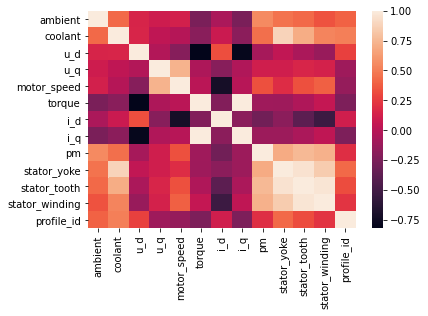

In [ ]:
import seaborn as sns
sns.heatmap(odsc_train.corr());

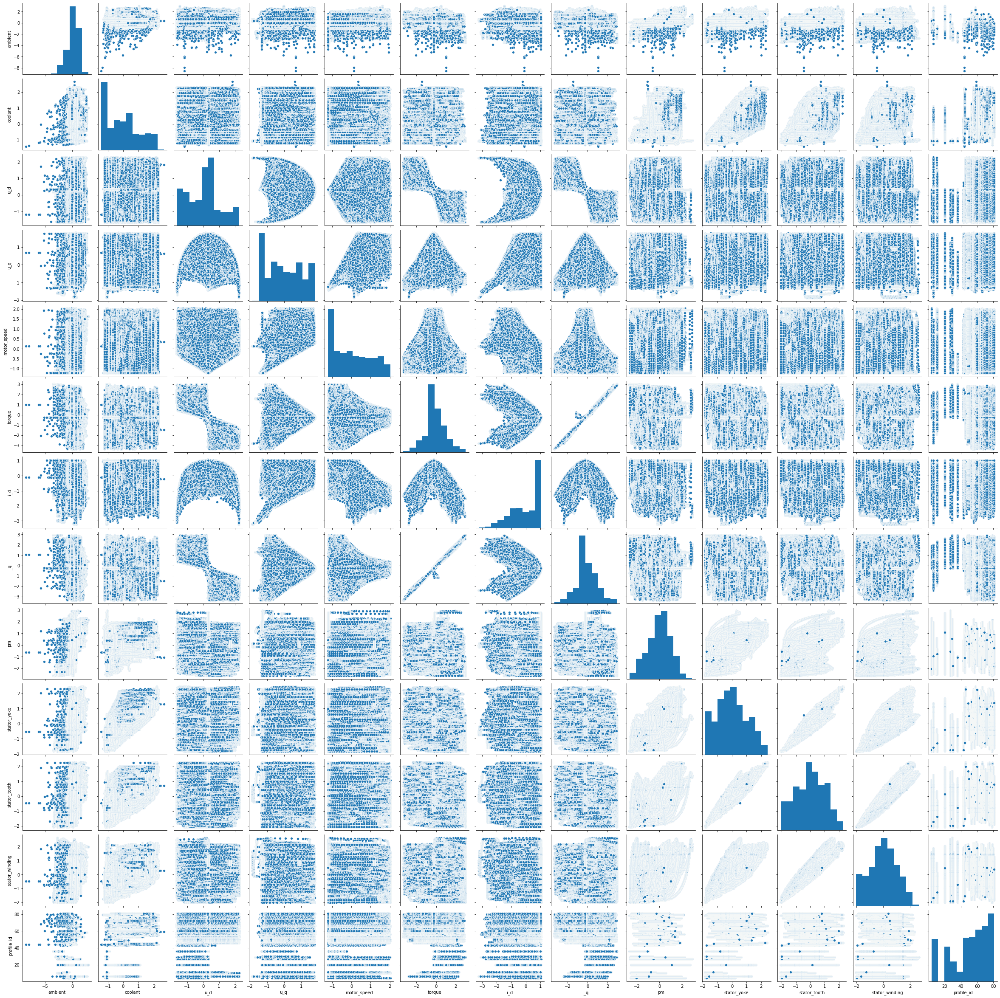

In [ ]:
sns.pairplot(odsc_train);

In [ ]:
plot_dat = odsc_train.copy()
for col in y_cols:
  plot_dat[col] = pd.Series([1 if x > 0 else -1 for x in plot_dat[col]], index=plot_dat.index)
plot_dat.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-1,-1,-1,-1,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-1,-1,-1,-1,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-1,-1,-1,-1,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-1,-1,-1,-1,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-1,-1,-1,-1,4


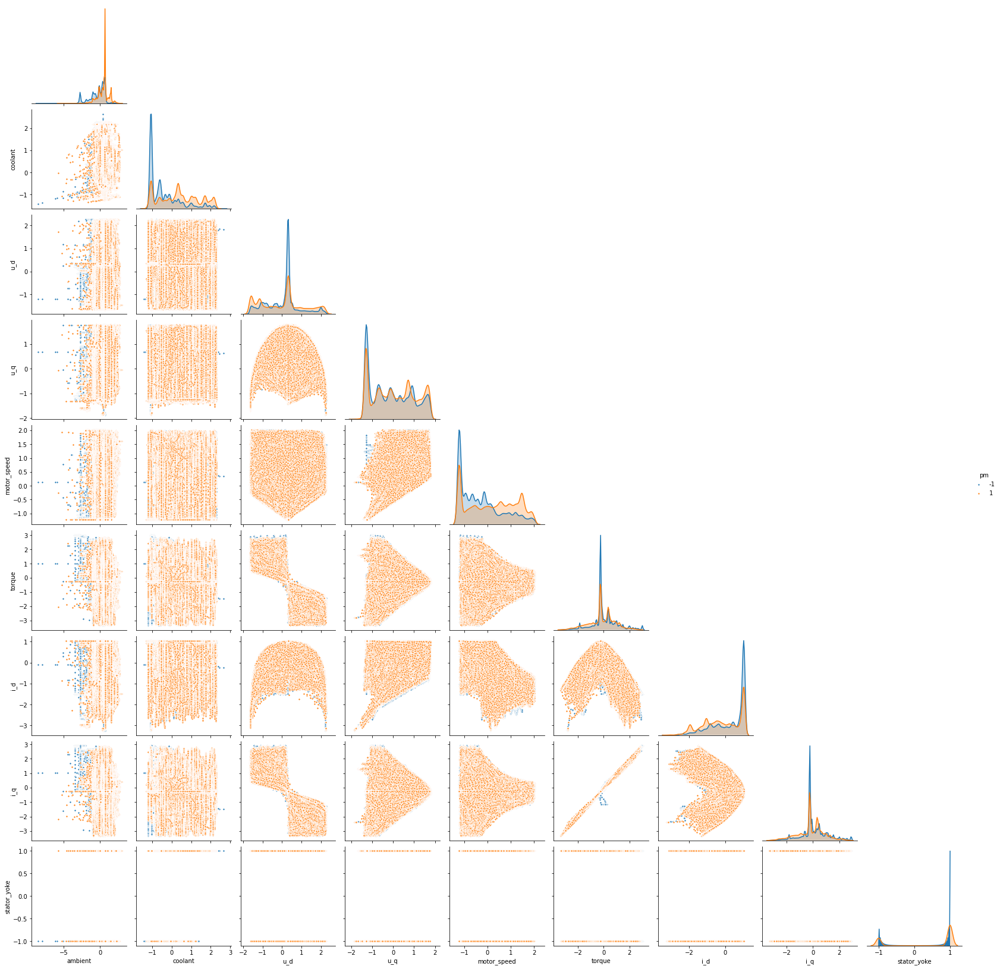

In [ ]:
sns.pairplot(plot_dat.iloc[:,:-3], hue='pm', corner=True, plot_kws = {"s":10});

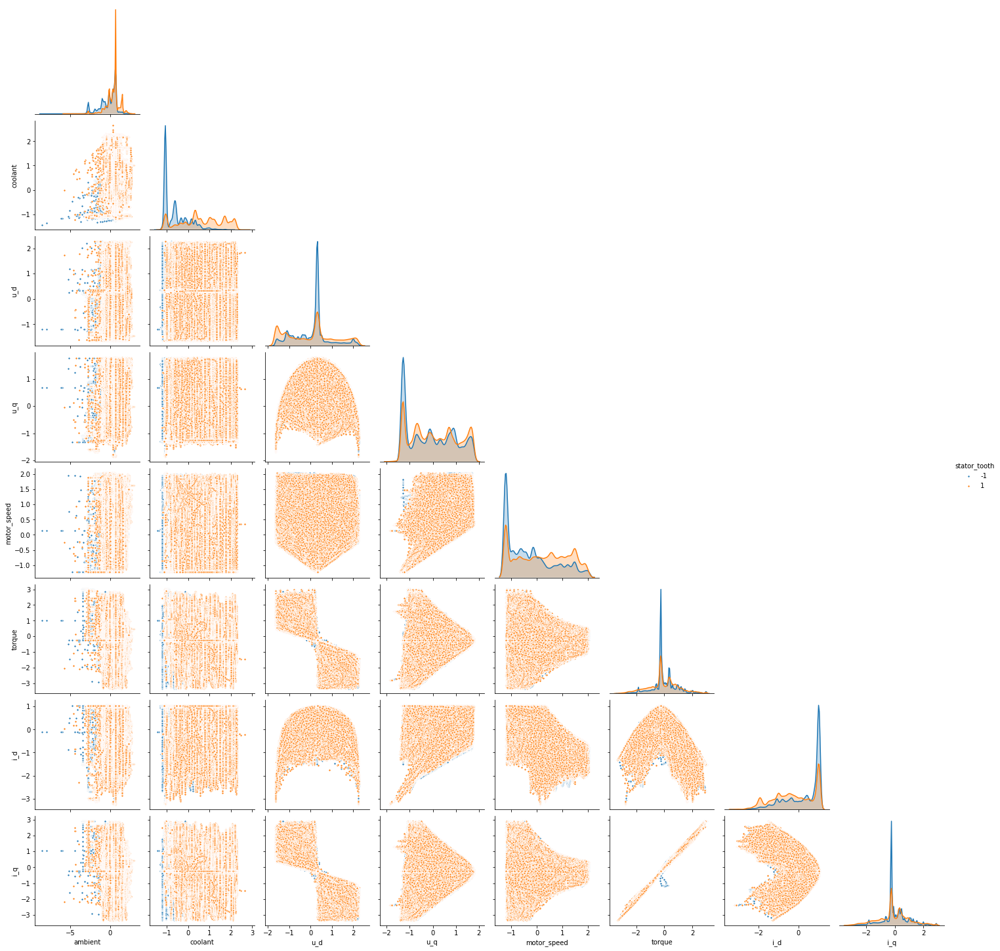

In [ ]:
sns.pairplot(plot_dat[list(test_cols)+['stator_tooth']], hue='stator_tooth', corner=True, plot_kws = {"s":10});

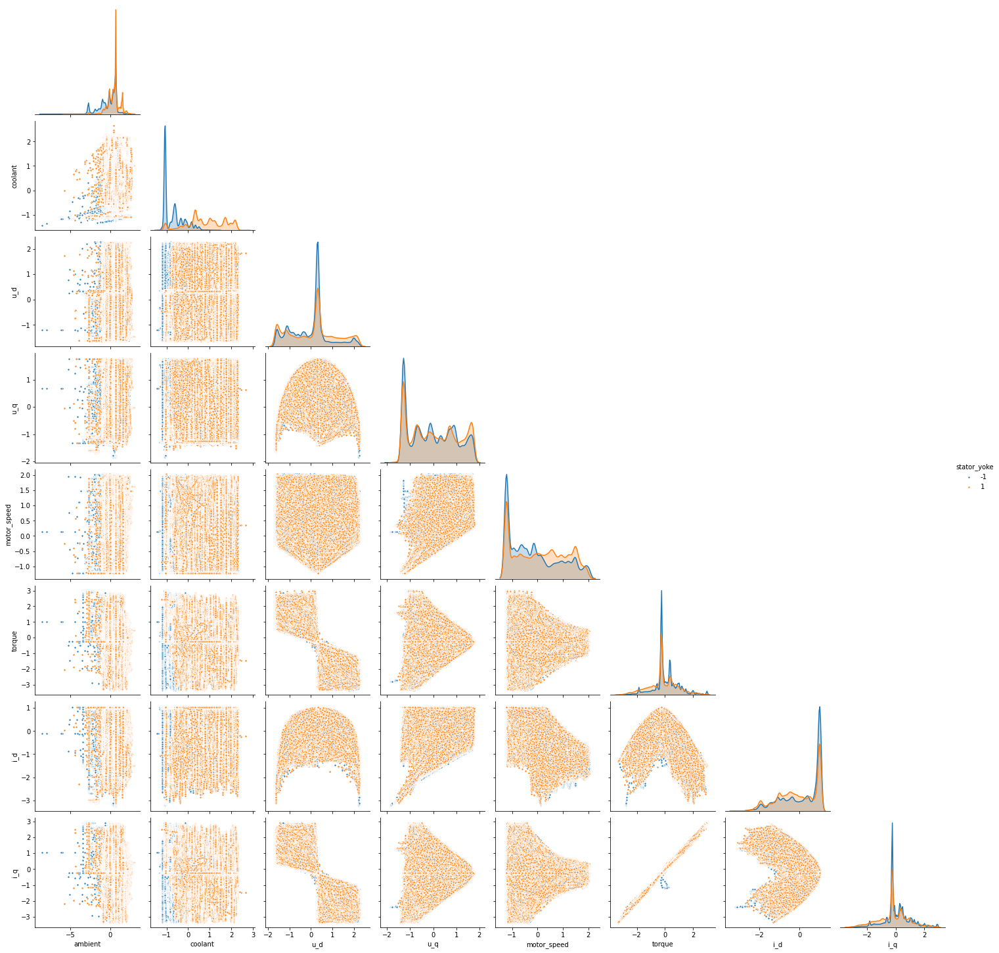

In [ ]:
sns.pairplot(plot_dat[list(test_cols)+['stator_yoke']], hue='stator_yoke', corner=True, plot_kws = {"s":10});

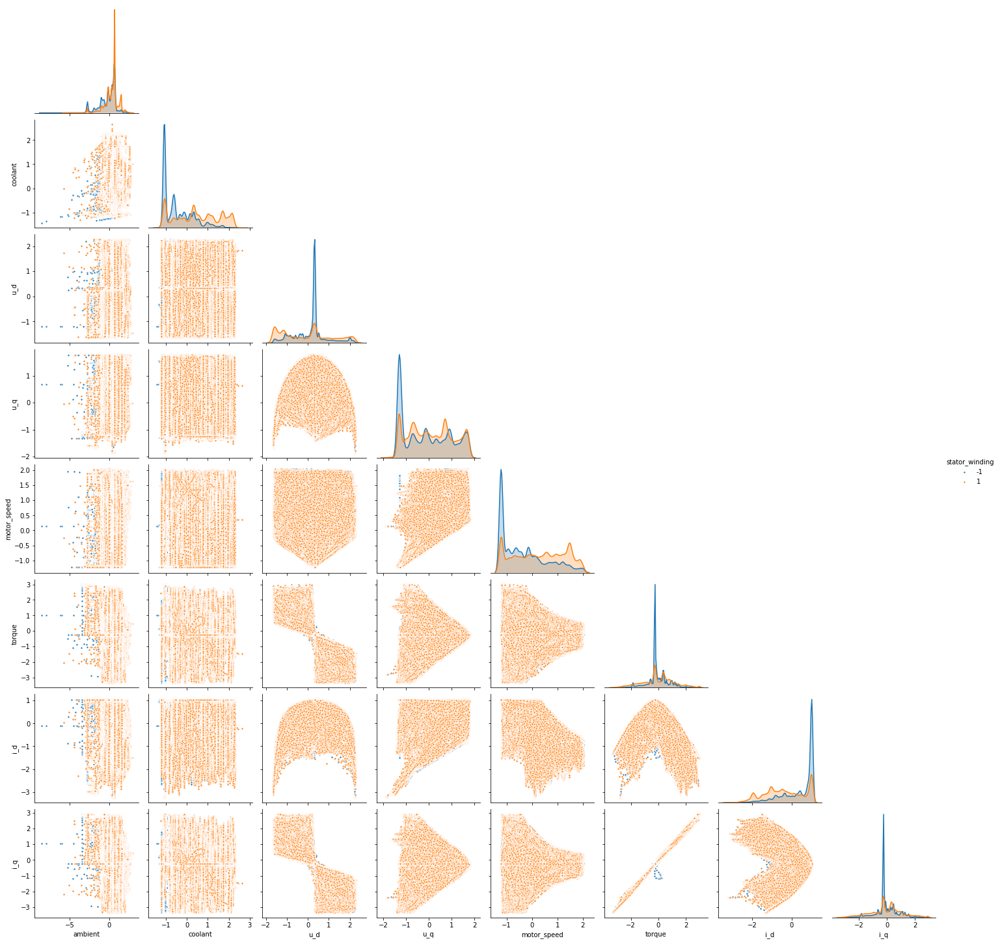

In [ ]:
sns.pairplot(plot_dat[list(test_cols)+['stator_winding']], hue='stator_winding', corner=True, plot_kws = {"s":10});

# Baseline with Random Forests, Bagging Regressors and Histogram-based Gradient Boosting Regression Tree

In [26]:
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_absolute_error

X = odsc_train[test_cols]
y = odsc_train[y_cols]
#y = odsc_train[list(y_cols) + ['profile_id']]

train_X, val_X, train_y, val_y = train_test_split(X, y, test_size=0.2, random_state=42)

In [27]:
# alt data split
X = odsc_train[test_cols]
y = odsc_train[y_cols]
train_X = X.loc[:625000]
val_X = X.loc[625001:]
train_y = y.loc[:625000]
val_y = y.loc[625001:]

In [28]:
%%time
from sklearn.ensemble import RandomForestRegressor

forest_model = RandomForestRegressor(n_estimators=100)
forest_model.fit(train_X, train_y)
ls_preds = forest_model.predict(val_X)
print('MAE of Random Forest Regressor: ', mean_absolute_error(val_y[y_cols], ls_preds[:,:4]))
# MAE of Random Forest Regressor:  0.039280051483559876

MAE of Random Forest Regressor:  0.5455297766129172
CPU times: user 14min 36s, sys: 5 s, total: 14min 41s
Wall time: 14min 42s


In [32]:
%%time
from sklearn.ensemble import BaggingRegressor
bagging = BaggingRegressor(n_estimators=40, max_samples=.3, n_jobs=-1)
bagging.fit(train_X, train_y)
ls_preds = bagging.predict(val_X)
print('MAE of Bagging Regressor: ', mean_absolute_error(val_y, ls_preds))
# MAE of Gradient Boosting Regressor:  0.039302096325726524

MAE of Bagging Regressor:  0.5213436188321023
CPU times: user 5 s, sys: 6.04 s, total: 11 s
Wall time: 1min 5s


### Histogram-based Gradient Boosting Regression Tree

This is a newer model inside of SKlearn, based off of lightLGBM, It is able to train and run on the whole dataset is about one 25th of the time it takes the other models to run. note how it can only train on one feature at a time. sadly, this model’s performance is bellow that of the random forest model. However if one is optimizing for training time this model is exceptional.
</br> I had implemented a simple grid-search technique in an effort to try and find optimal parameters (since the training time is so fast) in the hopes of getting this model to outperform the humble random forest, unfortunately, the results did not generalize well.


In [29]:
%%time
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
import numpy as np


# optimal results for training learning_rate=0.37, max_iter=3500, max_leaf_nodes=36, max_depth=12, min_samples_leaf=6


hgb_0 = HistGradientBoostingRegressor(learning_rate=0.2, max_iter=500, max_leaf_nodes=25, max_depth=30, min_samples_leaf=17, random_state=42)
hgb_0.fit(train_X, train_y[y_cols[0]])
ls_preds = hgb_0.predict(val_X)
mae_list =  [mean_absolute_error(val_y[y_cols[0]], ls_preds)]

hgb_1 = HistGradientBoostingRegressor(learning_rate=0.2, max_iter=500, max_leaf_nodes=25, max_depth=30, min_samples_leaf=17, random_state=42)
hgb_1.fit(train_X, train_y[y_cols[1]])
ls_preds = hgb_1.predict(val_X)
mae_list += [mean_absolute_error(val_y[y_cols[1]], ls_preds)]

hgb_2 = HistGradientBoostingRegressor(learning_rate=0.2, max_iter=500, max_leaf_nodes=25, max_depth=30, min_samples_leaf=17, random_state=42)
hgb_2.fit(train_X, train_y[y_cols[2]])
ls_preds = hgb_2.predict(val_X)
mae_list += [mean_absolute_error(val_y[y_cols[2]], ls_preds)]

hgb_3 = HistGradientBoostingRegressor(learning_rate=0.2, max_iter=500, max_leaf_nodes=25, max_depth=30, min_samples_leaf=17, random_state=42)
hgb_3.fit(train_X, train_y[y_cols[3]])
ls_preds = hgb_3.predict(val_X)
mae_list += [mean_absolute_error(val_y[y_cols[3]], ls_preds)]

print('Mean Absolute Error for Histogram-based Gradient Boosting Regression Tree is:', np.mean(mae_list))
# Mean Absolute Error for Histogram-based Gradient Boosting Regression Tree is: 0.17732416207632704
# Mean Absolute Error for Histogram-based Gradient Boosting Regression Tree is: 0.13116330085783717 # max_iter set to 1k, need to check for overfitting

Mean Absolute Error for Histogram-based Gradient Boosting Regression Tree is: 0.4409254304773396
CPU times: user 2min 26s, sys: 1.23 s, total: 2min 27s
Wall time: 37.6 s


In [30]:
# Grid search
def hgb_grid_search(lr=.2, m_iter=500, m_leaf=25, m_depth=30, min_leaf=17):
  mae_list = []

  hgb_0 = HistGradientBoostingRegressor(learning_rate=lr, max_iter=m_iter, max_leaf_nodes=m_leaf, max_depth=m_depth, min_samples_leaf=min_leaf, random_state=42)
  hgb_0.fit(train_X, train_y[y_cols[0]])
  ls_preds = hgb_0.predict(val_X)
  mae_list =  [mean_absolute_error(val_y[y_cols[0]], ls_preds)]

  hgb_1 = HistGradientBoostingRegressor(learning_rate=lr, max_iter=m_iter, max_leaf_nodes=m_leaf, max_depth=m_depth, min_samples_leaf=min_leaf, random_state=42)
  hgb_1.fit(train_X, train_y[y_cols[1]])
  ls_preds = hgb_1.predict(val_X)
  mae_list += [mean_absolute_error(val_y[y_cols[1]], ls_preds)]

  hgb_2 = HistGradientBoostingRegressor(learning_rate=lr, max_iter=m_iter, max_leaf_nodes=m_leaf, max_depth=m_depth, min_samples_leaf=min_leaf, random_state=42)
  hgb_2.fit(train_X, train_y[y_cols[2]])
  ls_preds = hgb_2.predict(val_X)
  mae_list += [mean_absolute_error(val_y[y_cols[2]], ls_preds)]

  hgb_3 = HistGradientBoostingRegressor(learning_rate=lr, max_iter=m_iter, max_leaf_nodes=m_leaf, max_depth=m_depth, min_samples_leaf=min_leaf, random_state=42)
  hgb_3.fit(train_X, train_y[y_cols[3]])
  ls_preds = hgb_3.predict(val_X)
  mae_list += [mean_absolute_error(val_y[y_cols[3]], ls_preds)]

  s_out = 'learning rate: ' +str(lr)+ ', max_iter: ' + str(m_iter) + ', max_leaf: ' + str(m_leaf)+ ', max_depth: ' + str(m_depth) + ', min_samples_leaf: ' + str(min_leaf) + ', MAE: ' + str(np.mean(mae_list))
  out = (s_out, mae_list)
  return out
 # print('Mean Absolute Error for Histogram-based Gradient Boosting Regression Tree is:', np.mean(mae_list))

In [31]:
# lr >.27 has best results so far
# max_leaf > 36
# max_depth = 12
# min_samples_leaf= 6

for i in range(8, 20, 2):
  _ = hgb_grid_search(m_leaf=36, lr=.3, m_depth=i, min_leaf=6, m_iter=850)
  print(_[0])
  print(_[1])
  print('')


learning rate: 0.3, max_iter: 850, max_leaf: 36, max_depth: 8, min_samples_leaf: 6, MAE: 0.46754139104593473
[0.5610631400212243, 0.4649194286527267, 0.36536126865654117, 0.478821726853247]

learning rate: 0.3, max_iter: 850, max_leaf: 36, max_depth: 10, min_samples_leaf: 6, MAE: 0.4700399673447195
[0.5570599105550694, 0.4739672356940411, 0.3685502042013964, 0.48058251892837106]

learning rate: 0.3, max_iter: 850, max_leaf: 36, max_depth: 12, min_samples_leaf: 6, MAE: 0.46419657740679293
[0.5575385193582745, 0.45605588876138037, 0.3567090339425269, 0.4864828675649899]

learning rate: 0.3, max_iter: 850, max_leaf: 36, max_depth: 14, min_samples_leaf: 6, MAE: 0.46597232551269907
[0.5574842978883805, 0.4602686057015585, 0.3507692134602201, 0.4953671850006372]

learning rate: 0.3, max_iter: 850, max_leaf: 36, max_depth: 16, min_samples_leaf: 6, MAE: 0.46481826864051634
[0.5473011198879976, 0.4589618054650032, 0.35412735201997203, 0.4988827971890925]

learning rate: 0.3, max_iter: 850, max_

## Permeation importance:
Below is the code I wrote for permeation importance. Permeation importance works by testing a model on the same dataset multiple times, each time it will select one feature and randomize the values and rerun to determine which features add signal and which contribute mostly noise. There is already a module for feature importance Eli5, however, its been having some issues which depreciations of some of its dependencies so I’ve been meaning to write my own function for a while.

As you can see below the majority on the signal was only coming from 3 features, the ambient temperature, the coolant temperature, and the d component current.

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
rfr = RandomForestRegressor(n_estimators=60)

def permiation_importance(df, target_cols, perc=0.5, model=rfr, print_status=False):
  df = df.loc[:int(len(df)*perc)]
  cols = df.columns
  X_cols = [x for x in cols if (x not in target_cols)]
  dict_out = {}
  
  X = df[X_cols]
  y = df[target_cols]
  train_X, val_X, train_y, val_y = train_test_split(X, y, test_size=0.2, random_state=42)
  model.fit(train_X, train_y)
  ls_preds = model.predict(val_X)
  baseline = mean_absolute_error(val_y, ls_preds)
  dict_out['baseline'] = baseline
  if print_status:
    print('Baseline:', baseline)

  counter = 1
  for col in X_cols:
    t_df = df.copy()
    t_df[col] = np.random.permutation(t_df[col].values)
    
    X = t_df[X_cols]
    y = t_df[target_cols]
    train_X, val_X, train_y, val_y = train_test_split(X, y, test_size=0.2, random_state=42)

    model.fit(train_X, train_y)
    ls_preds = model.predict(val_X)
    _mae = mean_absolute_error(val_y, ls_preds) - baseline
    dict_out[col] = _mae
    if print_status:
      print('column', counter, 'of', len(X_cols),',', col, 'has a score of', round(_mae, 4))
    counter+=1
  return pd.DataFrame(pd.Series(dict_out).sort_values(ascending=False))

In [ ]:
permiation_importance(odsc_train.drop('profile_id', axis=1), y_cols, perc=1., print_status=True)

Baseline: 0.038271742814536464
column 1 of 8 , ambient has a score of 0.0536
column 2 of 8 , coolant has a score of 0.1314
column 3 of 8 , u_d has a score of 0.0041
column 4 of 8 , u_q has a score of 0.005
column 5 of 8 , motor_speed has a score of 0.0038
column 6 of 8 , torque has a score of 0.0018
column 7 of 8 , i_d has a score of 0.0015
column 8 of 8 , i_q has a score of 0.0012


,0
coolant,0.131393
ambient,0.053607
baseline,0.038272
u_q,0.004999
u_d,0.004079
motor_speed,0.003831
torque,0.001849
i_d,0.001502
i_q,0.001193


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
rfr = RandomForestRegressor(n_estimators=60)

def permiation_importance_altsplit(df, target_cols, perc=0.5, model=rfr, print_status=False):
  df = df.loc[:int(len(df)*perc)]
  cols = df.columns
  X_cols = [x for x in cols if (x not in target_cols)]
  dict_out = {}
  
  X = df[X_cols]
  y = df[target_cols]
  train_X = X.loc[:int(len(df)*.8)]
  val_X = X.loc[(int(len(df)*.8))+1:]
  train_y = y.loc[:int(len(df)*.8)]
  val_y = y.loc[(int(len(df)*.8))+1:]
  
  model.fit(train_X, train_y)
  ls_preds = model.predict(val_X)
  baseline = mean_absolute_error(val_y, ls_preds)
  dict_out['baseline'] = baseline
  if print_status:
    print('Baseline:', baseline)

  counter = 1
  for col in X_cols:
    t_df = df.copy()
    t_df[col] = np.random.permutation(t_df[col].values)
    
    X = t_df[X_cols]
    y = t_df[target_cols]
    train_X = X.loc[:int(len(df)*.8)]
    val_X = X.loc[(int(len(df)*.8))+1:]
    train_y = y.loc[:int(len(df)*.8)]
    val_y = y.loc[(int(len(df)*.8))+1:]
    
    model.fit(train_X, train_y)
    ls_preds = model.predict(val_X)
    _mae = mean_absolute_error(val_y, ls_preds) - baseline
    dict_out[col] = _mae
    if print_status:
      print('column', counter, 'of', len(X_cols),',', col, 'has a score of', round(_mae, 4))
    counter+=1
  return pd.DataFrame(pd.Series(dict_out).sort_values(ascending=False))

In [ ]:
permiation_importance_altsplit(odsc_train.drop('profile_id', axis=1), y_cols, perc=1., print_status=True)

Baseline: 0.5380009081131043
column 1 of 8 , ambient has a score of 0.0291
column 2 of 8 , coolant has a score of 0.1632
column 3 of 8 , u_d has a score of -0.0084
column 4 of 8 , u_q has a score of 0.0001
column 5 of 8 , motor_speed has a score of -0.0038
column 6 of 8 , torque has a score of -0.0004
column 7 of 8 , i_d has a score of -0.0038
column 8 of 8 , i_q has a score of 0.0018


,0
baseline,0.538001
coolant,0.163228
ambient,0.029089
i_q,0.001765
u_q,0.000115
torque,-0.000371
motor_speed,-0.003777
i_d,-0.003800
u_d,-0.008429


# Create baseline submission

In [ ]:
submission_preds = forest_model.predict(odsc_test)
print('overal MAE: ', mean_absolute_error(submission_preds[:,:4], solutions))
submission_preds = pd.DataFrame(submission_preds[:,:4], columns=y_cols)
print('MAE of ', y_cols[0], ': ', mean_absolute_error(submission_preds[y_cols[0]], solutions[y_cols[0]]))
print('MAE of ', y_cols[1], ': ', mean_absolute_error(submission_preds[y_cols[1]], solutions[y_cols[1]]))
print('MAE of ', y_cols[2], ': ', mean_absolute_error(submission_preds[y_cols[2]], solutions[y_cols[2]]))
print('MAE of ', y_cols[3], ': ', mean_absolute_error(submission_preds[y_cols[3]], solutions[y_cols[3]]))

overal MAE:  0.6703715349374051
MAE of  pm :  0.9194497973816134
MAE of  stator_tooth :  0.6265999970620469
MAE of  stator_yoke :  0.452621883196744
MAE of  stator_winding :  0.682814462109231


In [33]:
submission_preds = bagging.predict(odsc_test)
print('overal MAE: ', mean_absolute_error(submission_preds, solutions))
submission_preds = pd.DataFrame(submission_preds, columns=y_cols)
print('MAE of ', y_cols[0], ': ', mean_absolute_error(submission_preds[y_cols[0]], solutions[y_cols[0]]))
print('MAE of ', y_cols[1], ': ', mean_absolute_error(submission_preds[y_cols[1]], solutions[y_cols[1]]))
print('MAE of ', y_cols[2], ': ', mean_absolute_error(submission_preds[y_cols[2]], solutions[y_cols[2]]))
print('MAE of ', y_cols[3], ': ', mean_absolute_error(submission_preds[y_cols[3]], solutions[y_cols[3]]))

overal MAE:  0.6023314665220132
MAE of  pm :  0.8277936161976579
MAE of  stator_tooth :  0.556706798700782
MAE of  stator_yoke :  0.40005561955382557
MAE of  stator_winding :  0.6247698316357809


In [ ]:
submission_preds = np.zeros(solutions.shape)
submission_preds = pd.DataFrame(submission_preds, columns=y_cols)

submission_preds[y_cols[0]] = hgb_0.predict(odsc_test)
submission_preds[y_cols[1]] = hgb_1.predict(odsc_test)
submission_preds[y_cols[2]] = hgb_2.predict(odsc_test)
submission_preds[y_cols[3]] = hgb_3.predict(odsc_test)

print('overal MAE: ', mean_absolute_error(submission_preds, solutions))
print('MAE of ', y_cols[0], ': ', mean_absolute_error(submission_preds[y_cols[0]], solutions[y_cols[0]]))
print('MAE of ', y_cols[1], ': ', mean_absolute_error(submission_preds[y_cols[1]], solutions[y_cols[1]]))
print('MAE of ', y_cols[2], ': ', mean_absolute_error(submission_preds[y_cols[2]], solutions[y_cols[2]]))
print('MAE of ', y_cols[3], ': ', mean_absolute_error(submission_preds[y_cols[3]], solutions[y_cols[3]]))

overal MAE:  0.6259456204470294
MAE of  pm :  0.9043503635915747
MAE of  stator_tooth :  0.5695247918047167
MAE of  stator_yoke :  0.3852952534279453
MAE of  stator_winding :  0.6446120729638748


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive
